# Capstone project - Study of the correlation between obesity and restaurant density in England

## 1. Introduction : Business Problem

Obesity is the second cause of premature death in Europe, preceded only by smoking. A research has demonstrated that 1 in 7 premature deaths could be avoided if people had a healthy weigth. What if the risk of obesity was linked to the density of restaurants in the surrounding of the person at risk? What if there were correlations between the number of tentations at which a person is subjected to and the risk that is person will suffer from obesity? 

The following project aims to provide answer to the following question: 

**_"Is there any link between obesity and the density of restaurants in the surrounding of where a person lives in England?"_**

The results of this study could be useful for the Department of Health and Social Care of United Kingdom but could be expanded to any other region that suffer from high mortality due to obesity such as the rest of Europe or the United States.

## 2. Data

Based on our problem, we wil need as data:

1. We will first need obesity statistics in each of the neighborhood. These data are available on Kaggle but require to create an account. We will thus locally download these data and upload them for the project. These data consist of a number of admission as obesity case in each neighborhood in 2015/2016. The dataset contains information for each neighborhood of England, but we will focus only on the Greater London for this project. Each row of the dataset (after some cleaning) consists of various attributes, but we will only use some of them, namely the name of the neighborhood and the number of admissions per 100 000 population for male, female and both. ([Kagglle](https://www.kaggle.com/fayomi/obesity-in-london-by-gender-region-time/data))
2. We will need also the locations of the neighborhood of the Greater London. We will use the package Geopy to obtain the geographical coordinates of each neighborhood. We will look for the coordinates by searching them with Geopy.geocoder using the names of the neighborhood obtained in the previous step. ([Geopy](https://geopy.readthedocs.io/en/stable/))
3. We finally need Foursquare data to study the surrounding of the center of each neighborhood and evaluate their density of restaurants. We will search the venues for each neighborhood in a certain radius and then filter the results by searching the venues that contain the word "_restaurant_". ([Foursquare](https://foursquare.com/))

Let's first start by importing the library.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from geopy.geocoders import Nominatim
 # library to get coordinates

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import prepocessing
from sklearn import preprocessing

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


We now import locally the obesisty statistics.

In [2]:
df=pd.ExcelFile('obes-phys-acti-diet-eng-2017-tab.xlsx')
#to identify all the different sheets available
df.sheet_names

['Contents',
 'Table 1',
 'Table 2',
 'Table 3',
 'Table 4',
 'Table 5',
 'Table 6',
 'Table 7',
 'Table 8',
 'Table 9',
 'Table 10',
 'Table 11',
 'Table 12',
 'Table 13',
 'Table 14']

In [3]:
data=df.parse(u'Table 7', skiprows=12, skipfooter=14)
data.drop(data.index[[12,13,37,38,54,55,65,66,81,82,94,95,129,130,150,151]],inplace=True) #remove all useless row
data=data.reset_index()
data.head()

,index,E12000001,Unnamed: 1,A,North East,20188,7039,13148,Unnamed: 7,781,565,991
0,0,E06000047,NaN,116,County Durham,3373.0,1283.0,2089.0,NaN,647.0,502.0,787.0
1,1,E06000005,NaN,117,Darlington,649.0,274.0,375.0,NaN,623.0,541.0,698.0
2,2,E08000037,NaN,106,Gateshead,1428.0,405.0,1023.0,NaN,716.0,427.0,1003.0
3,3,E06000001,NaN,111,Hartlepool,554.0,208.0,346.0,NaN,616.0,473.0,751.0
4,4,E06000002,NaN,112,Middlesbrough,829.0,298.0,531.0,NaN,657.0,496.0,812.0


For the study case, we just need the names of the english district (fifth column) and the number of admission for male, female ans both per 100,000 population (last three columns).

In [4]:
#rename all the relevant columns we need
data=data.rename(columns={'North East':'Regions',781:'All',565:'Male',991:'Female'})
#format the data so it only contains relevant columns
data=data[['Regions','All','Male','Female']]

In [5]:
data.head()

,Regions,All,Male,Female
0,County Durham,647.0,502.0,787.0
1,Darlington,623.0,541.0,698.0
2,Gateshead,716.0,427.0,1003.0
3,Hartlepool,616.0,473.0,751.0
4,Middlesbrough,657.0,496.0,812.0


In [6]:
print("We have thus obesity data for {} different districts".format(data.shape[0]))

We have thus obesity data for 152 different districts


Being on possession of the names of the districts, we can now do a research of the geographical coordinates of the districts using their name with geopy. Note that geopy will note return all districts coordinates, so we should remove some districts from the study after. 

In [7]:
geolocator = Nominatim(user_agent="London_explorer")

column_names = ['Regions','All','Male','Female','Latitude','Longitude'] 
new_df= pd.DataFrame(columns=column_names)
for reg,al,mal,fem in zip(data['Regions'],data['All'],data['Male'],data['Female']):
    location = None
    print(reg)

    # loop until you get the coordinates
    location = geolocator.geocode('{}, London, England'.format(reg))
    if location is None:
        pass
    else:
        latitude = location.latitude
        longitude = location.longitude
        new_df=new_df.append({'Regions':reg,'All': al,
                                          'Male': mal,
                                          'Female': fem,
                                          'Latitude': latitude,'Longitude':longitude}, ignore_index=True)

County Durham
Darlington
Gateshead
Hartlepool
Middlesbrough
Newcastle upon Tyne
North Tyneside
Northumberland
Redcar and Cleveland
South Tyneside
Stockton-on-Tees
Sunderland
Blackburn with Darwen
Blackpool
Bolton
Bury
Cheshire East
Cheshire West and Chester
Cumbria
Halton
Knowsley
Lancashire
Liverpool
Manchester
Oldham
Rochdale
Salford
Sefton
St. Helens
Stockport
Tameside
Trafford
Warrington
Wigan
Wirral
Barnsley
Bradford
Calderdale
Doncaster
East Riding of Yorkshire
Kingston upon Hull, City of
Kirklees
Leeds
North East Lincolnshire
North Lincolnshire
North Yorkshire
Rotherham
Sheffield
Wakefield
York
Derby
Derbyshire
Leicester
Leicestershire
Lincolnshire
Northamptonshire
Nottingham
Nottinghamshire
Rutland                                                                         
Birmingham
Coventry
Dudley
Herefordshire, County of
Sandwell
Shropshire
Solihull
Staffordshire
Stoke-on-Trent
Telford and Wrekin
Walsall
Warwickshire
Wolverhampton
Worcestershire
Bedford
Cambridgeshire
Central B

In [8]:
print('We have thus data for {} district and have lost data for {} districts, which is satisfying.'.format(new_df.shape[0],data.shape[0]-new_df.shape[0]))

We have thus data for 138 district and have lost data for 14 districts, which is satisfying.


__Let's see how our dataframe looks like now.__

In [9]:
new_df.head()

,Regions,All,Male,Female,Latitude,Longitude
0,County Durham,647.0,502.0,787.0,53.872616,-1.705963
1,Darlington,623.0,541.0,698.0,51.536151,-0.134964
2,Gateshead,716.0,427.0,1003.0,54.958554,-1.605700
3,Hartlepool,616.0,473.0,751.0,54.695701,-1.200316
4,Middlesbrough,657.0,496.0,812.0,54.576042,-1.234405


We can now explore the venue around the center of each district. We should note that our Foursquare developper account only allows to get 100 venues maximum around a location. We shoud thus explore the venues in a small radius to avoid to reach the limit of 100. We thus choose to explore the venue in a radius of 300 meters around the center of each district. 

In [10]:
CLIENT_ID = 'HL301XKAVEOZZXFZW0VPNHOOX1SUOP4KH4GBYLMGE0SKK3PQ' # your Foursquare ID
CLIENT_SECRET = 'HBGTZYKALAYL10HFH2WWGD4BZSNY3PPMRATRS2DHFJZ1Z44F' # your Foursquare Secret
VERSION = '20160605' # Foursquare API version
LIMIT=200
radius=300
print('Credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Credentails:
CLIENT_ID: HL301XKAVEOZZXFZW0VPNHOOX1SUOP4KH4GBYLMGE0SKK3PQ
CLIENT_SECRET:HBGTZYKALAYL10HFH2WWGD4BZSNY3PPMRATRS2DHFJZ1Z44F


In [11]:
def getNearbyVenues(names, latitudes, longitudes, radius,LIMIT):  #function to return the venues arond a location
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [13]:
london_venues = getNearbyVenues(new_df['Regions'],new_df['Latitude'],new_df['Longitude'],radius,LIMIT )

County Durham
Darlington
Gateshead
Hartlepool
Middlesbrough
Newcastle upon Tyne
North Tyneside
Northumberland
Redcar and Cleveland
South Tyneside
Stockton-on-Tees
Sunderland
Blackburn with Darwen
Blackpool
Bolton
Bury
Cumbria
Halton
Knowsley
Lancashire
Liverpool
Manchester
Oldham
Rochdale
Salford
Sefton
St. Helens
Stockport
Tameside
Trafford
Warrington
Wigan
Wirral
Barnsley
Bradford
Calderdale
Doncaster
East Riding of Yorkshire
Kirklees
Leeds
North Yorkshire
Rotherham
Sheffield
Wakefield
York
Derby
Derbyshire
Leicester
Northamptonshire
Nottingham
Nottinghamshire
Rutland                                                                         
Birmingham
Coventry
Dudley
Sandwell
Shropshire
Solihull
Staffordshire
Stoke-on-Trent
Telford and Wrekin
Walsall
Warwickshire
Wolverhampton
Worcestershire
Bedford
Cambridgeshire
Essex
Hertfordshire
Luton
Norfolk
Peterborough
Southend-on-Sea
Suffolk
Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
City of London
Croydon
Ealing
Enfield
Greenwic

We have now the venues for each district.

In [14]:
london_venues.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,County Durham,53.872616,-1.705963,Coopers,53.872443,-1.709254,Pub
1,County Durham,53.872616,-1.705963,M&S Simply Food,53.871140,-1.709212,Grocery Store
2,County Durham,53.872616,-1.705963,Boots,53.871403,-1.709054,Pharmacy
3,County Durham,53.872616,-1.705963,KFC,53.871586,-1.709217,Fast Food Restaurant
4,County Durham,53.872616,-1.705963,Costa Coffee,53.871772,-1.709453,Coffee Shop
5,County Durham,53.872616,-1.705963,Aireborough Leisure Centre,53.872613,-1.707208,Gym / Fitness Center
6,County Durham,53.872616,-1.705963,Pets at Home,53.871524,-1.709276,Pet Store
7,Darlington,51.536151,-0.134964,KOKO,51.534730,-0.137892,Music Venue
8,Darlington,51.536151,-0.134964,Ramen Seto,51.536127,-0.138946,Ramen Restaurant
9,Darlington,51.536151,-0.134964,Chai Thali,51.537870,-0.136833,Restaurant


In [15]:
london_venues.groupby("Neighborhood").count().reset_index().head() #grouping by district

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Barking and Dagenham,3,3,3,3,3,3
1,Barnet,6,6,6,6,6,6
2,Barnsley,20,20,20,20,20,20
3,Bedford,48,48,48,48,48,48
4,Bexley,7,7,7,7,7,7


We can now calculate the density of restaurants by filtering the venue category with word related to dining.

In [16]:
filtre=london_venues[london_venues['Venue Category'].str.contains('restaurant|pub|lounge|food|taverna|diner|steakhouse',case=False,regex=True)]
food=filtre.groupby("Neighborhood").count().reset_index()
food.rename(columns={'Venue Category':'Restaurants'},inplace=True)
food

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Restaurants
0,Barnet,3,3,3,3,3,3
1,Barnsley,3,3,3,3,3,3
2,Bedford,16,16,16,16,16,16
3,Bexley,6,6,6,6,6,6
4,Birmingham,12,12,12,12,12,12
5,Blackburn with Darwen,1,1,1,1,1,1
6,Blackpool,13,13,13,13,13,13
7,Bolton,2,2,2,2,2,2
8,Bournemouth,9,9,9,9,9,9
9,Bracknell Forest,1,1,1,1,1,1


We can now add the __Restaurants__ column to the "new_df" dataframe and then we could start our analysis.

In [17]:
final=pd.concat([new_df.set_index('Regions'),food[["Neighborhood","Restaurants"]].set_index('Neighborhood')], axis=1, join='inner')
final=final.reset_index().rename(columns={'index':'District'})
final

,District,All,Male,Female,Latitude,Longitude,Restaurants
0,County Durham,647.0,502.0,787.0,53.872616,-1.705963,2
1,Darlington,623.0,541.0,698.0,51.536151,-0.134964,4
2,Gateshead,716.0,427.0,1003.0,54.958554,-1.605700,2
3,Middlesbrough,657.0,496.0,812.0,54.576042,-1.234405,4
4,Newcastle upon Tyne,737.0,451.0,1038.0,54.973847,-1.613157,18
5,North Tyneside,1315.0,982.0,1623.0,55.029799,-1.508256,1
6,Northumberland,1292.0,961.0,1617.0,51.471186,0.161145,2
7,South Tyneside,479.0,361.0,589.0,54.969874,-1.447681,1
8,Stockton-on-Tees,548.0,410.0,682.0,54.564094,-1.312916,2
9,Sunderland,757.0,453.0,1054.0,54.906379,-1.375053,4


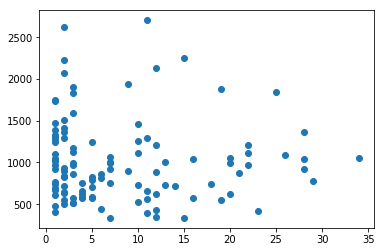

In [18]:
#X=new[['Venue Category','All'"]]
#X=preprocessing.StandardScaler().fit(X).transform(X.astype(float))
x=final['Restaurants']
y=final["All"]

%matplotlib inline
plt.scatter(x,y)

/home/jupyterlab/conda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


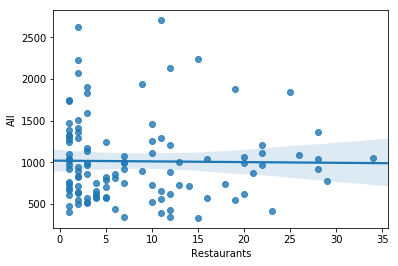

In [19]:
import seaborn as sns
sns.regplot(x='Restaurants',y='All',data=final)

Let's first start by visualization of the data by looking at choropleth maps of the obesity admission and compares it to the choropeth maps of the density of restaurants.

In [22]:
uk_geo=r'lad.json'

In [32]:
uk_map = folium.Map(location=[54.5, -5], zoom_start=6, tiles='Mapbox Bright')
uk_map.choropleth(
geo_data=uk_geo,
data=final,
columns=['District', 'All'],
key_on='feature.properties.LAD13NM',
fill_color='YlOrRd',
fill_opacity=0.7,
line_opacity=0.2,
legend_name='Admission per 100,000 population'
)
uk_map

In [31]:
#uk_map_rest = folium.Map(location=[54.5, -5],zoom_start=6, tiles='Mapbox Bright')
#uk_map_rest.choropleth(
#geo_data=uk_geo,
#data=final,
#columns=['District', 'Restaurants'],
#key_on='feature.properties.LAD13NM',
#fill_color='YlOrRd',
#fill_opacity=0.7,
#line_opacity=0.2,
#legend_name='Density of restaurants'
#)
#uk_map_rest